Imports

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud

from sklearn.metrics import f1_score            # Для подсчета метрики
import joblib                                   # Для сохранения модели


nltk.download('stopwords')
nltk.download('punkt')

# Обзор датасета 📊📚

In [ ]:
df = pd.read_csv(r'dataset/text.csv') # подгружаем наши данные в Pandas DataFrame

In [ ]:
df.head(5) # Смотрим первые 5 записей

In [ ]:
df.info()

In [ ]:
df.describe()

In [ ]:
df['label'].value_counts()

Мы имеем несколько(6) лейблов: sadness (0), joy (1), love (2), anger (3), fear (4), и surprise (5)

# Исследование данных 🕵️‍♂️📈

In [ ]:
# Сопоставим числовые метки с названиями эмоций
emotion_mapping = {0: 'Sadness', 1: 'Joy', 2: 'Love', 3: 'Anger', 4: 'Fear', 5: 'Surprise'}
df['emotion_name'] = df['label'].map(emotion_mapping)

In [ ]:
# Построим круговую диаграмму (pie) распределения эмоций
emotion_distribution = df['emotion_name'].value_counts().reset_index()
emotion_distribution.columns = ['Emotion', 'Count']

fig = px.pie(emotion_distribution, names='Emotion', values='Count', title='Распределение эмоций')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [ ]:
fig = px.histogram(df, x='emotion_name', title='Распределение эмоций',
                   labels={'emotion_name': 'Emotion Label', 'count': 'Number of Tweets'})
fig.update_layout(bargap=0.1)
fig.show()

In [169]:
# Проверим корреляцию между эмоцией и длинной поста
fig = px.scatter(df, x=df['text'].apply(len), y='emotion_name', title='Корреляция между Эмоцией и Длинной поста',
                 labels={'x': 'Text Length', 'y': 'Emotion Label'})
fig.update_traces(marker=dict(size=8, color='blue'), selector=dict(mode='markers'))
fig.show()

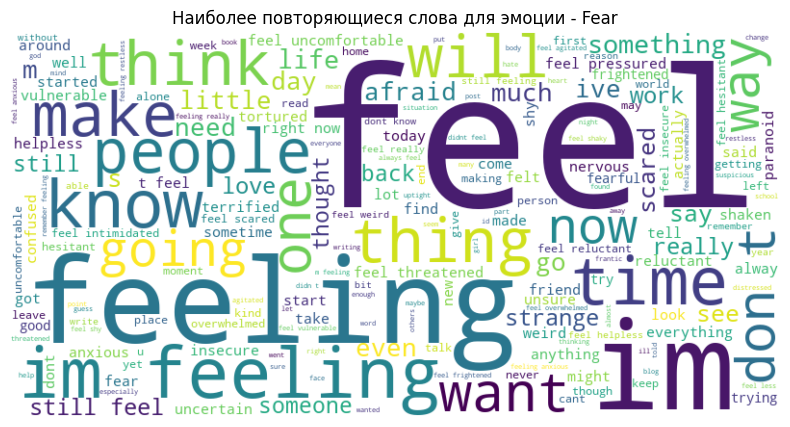

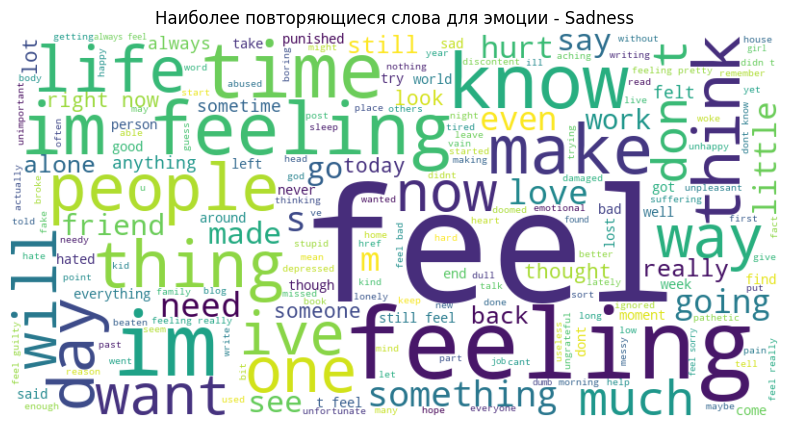

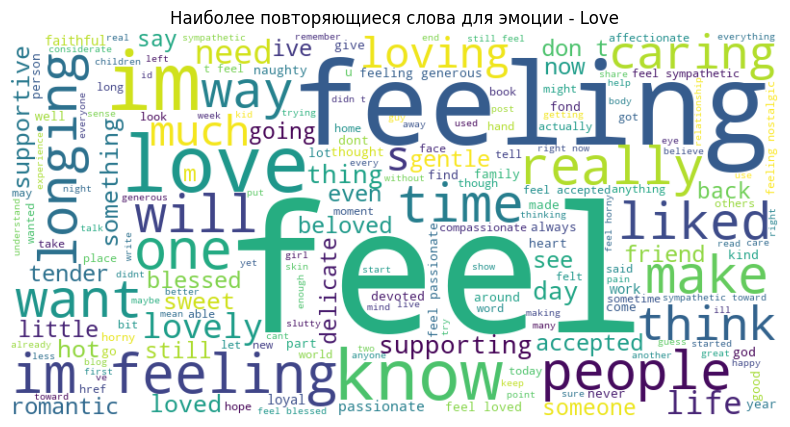

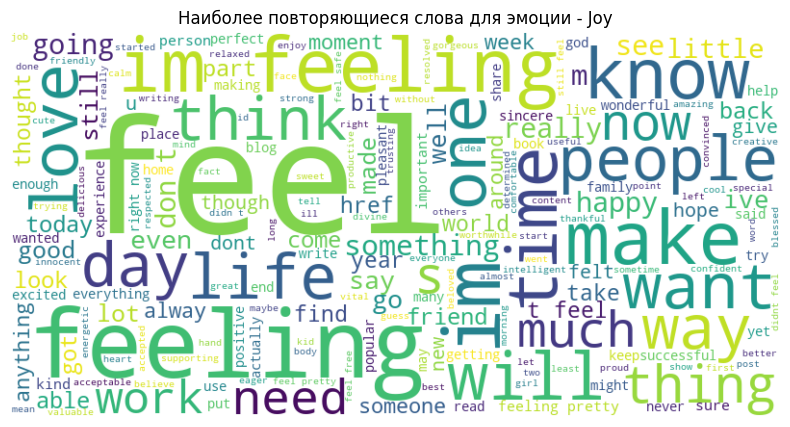

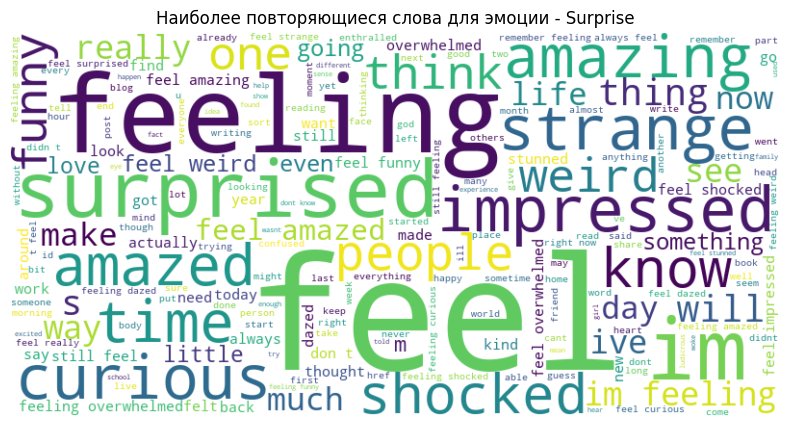

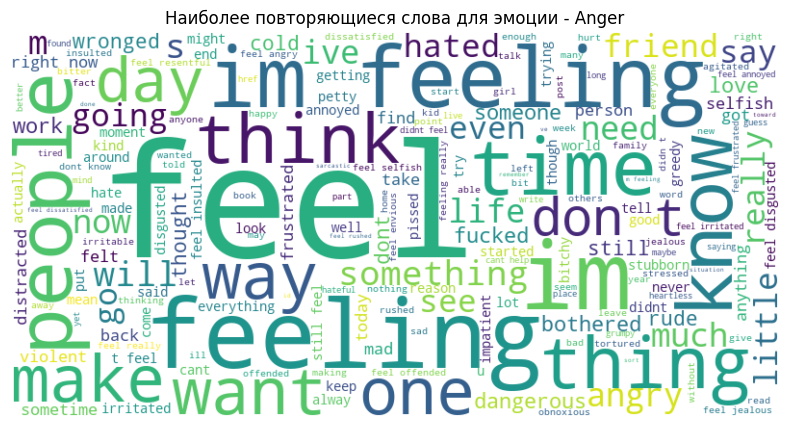

In [170]:
# Построим карту наиболее повторяющихся слов в каждой Эмоции
emotions = df['emotion_name'].unique()
for emotion in emotions:
    words = ' '.join(df[df['emotion_name'] == emotion]['text'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(words)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Наиболее повторяющиеся слова для эмоции - {emotion}')
    plt.show()

# Нормализация текста 📝✂️

In [171]:
stemmer = PorterStemmer()
stop_words = set(stopwords.words('english'))

# Функция для нормализации нашего текста
def clean_text(text):
    text = text.lower()
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'www\.\S+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub('\w*\d\w*', '', text)
    tokens = word_tokenize(text)
    # Удаляем стоп-слова
    cleaned_tokens = [stemmer.stem(token) for token in tokens if token not in stop_words]
    cleaned_text = ' '.join(cleaned_tokens)
    return cleaned_text

# Нормализуем столбец 'text' у нашего датасета
df['cleaned_text'] = df['text'].apply(clean_text)

# Сравниваем обычный текст и нормализованный
print(df[['text', 'cleaned_text']])

                                                     text  \
0           i just feel really helpless and heavy hearted   
1       ive enjoyed being able to slouch about relax a...   
2       i gave up my internship with the dmrg and am f...   
3                              i dont know i feel so lost   
4       i am a kindergarten teacher and i am thoroughl...   
...                                                   ...   
416804  i feel like telling these horny devils to find...   
416805  i began to realize that when i was feeling agi...   
416806  i feel very curious be why previous early dawn...   
416807  i feel that becuase of the tyranical nature of...   
416808  i think that after i had spent some time inves...   

                                             cleaned_text  
0                        feel realli helpless heavi heart  
1       ive enjoy abl slouch relax unwind frankli need...  
2                    gave internship dmrg feel distraught  
3                          

# Разбиваем датасет на тренировочную и тестовую выборки 🔄📊

In [172]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df['cleaned_text'], df['label'], test_size=0.2, random_state=42)

print("\nОбъемы Тестовых и тренировочных выборок:")
print("X_train:", X_train.shape)
print("X_test:", X_test.shape)
print("y_train:", y_train.shape)
print("y_test:", y_test.shape)


Объемы Тестовых и тренировочных выборок:
X_train: (333447,)
X_test: (83362,)
y_train: (333447,)
y_test: (83362,)


# Векторизируем текст 📊🔠

In [173]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(max_features=5000)

X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

print("\nОбъемы векторизированных выборок:")
print("X_train_tfidf:", X_train_tfidf.shape)
print("X_test_tfidf:", X_test_tfidf.shape)


Объемы векторизированных выборок:
X_train_tfidf: (333447, 5000)
X_test_tfidf: (83362, 5000)


# Обучение моделей через простые алгоритмы (SKLearn)

In [178]:
from datetime import datetime
def get_current_time() -> str:
    cur_time = datetime.strftime(datetime.now(), "%d-%m-%Y_%H-%M")
    return cur_time

current_time = get_current_time()

In [179]:
print(current_time)

07-03-2024_21-19


## Обучение классификатора Наивного Байеса 🤖🧠

In [180]:
from sklearn.naive_bayes import MultinomialNB   # Сам алгоритм обучения

naive_bayes_classifier = MultinomialNB()

# Обучим классификатор на наших векторизированных выборках
naive_bayes_classifier.fit(X_train_tfidf, y_train)

# Предскажем значения на тестовой выборке
naive_bayes_y_pred = naive_bayes_classifier.predict(X_test_tfidf)

naive_bayes_f1_metric = f1_score(y_test, naive_bayes_y_pred, average='weighted')

joblib.dump(naive_bayes_classifier, rf'weights\NB_f1_{naive_bayes_f1_metric:.3f}_{current_time}.pkl') 
joblib.dump(tfidf_vectorizer, rf'weights\NB_f1_{naive_bayes_f1_metric:.3f}_{current_time}_vectorizer.pkl') 

['weights\\NB_f1_0.791_07-03-2024_21-19_vectorizer.pkl']

## Обучение классификатора Логистической Регрессии 📈💡

In [181]:
from sklearn.linear_model import LogisticRegression

LR = LogisticRegression(random_state=42, class_weight='balanced')

LR.fit(X_train_tfidf, y_train)
LR_y_pred = LR.predict(X_test_tfidf)

LR_f1_metric = f1_score(y_test, LR_y_pred, average='weighted')
joblib.dump(LR, rf'weights\LR_f1_{LR_f1_metric:.3f}_{current_time}.pkl') 
joblib.dump(tfidf_vectorizer, rf'weights\LR_f1_{LR_f1_metric:.3f}_{current_time}_vectorizer.pkl') 

c:\Users\maxim\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



['weights\\LR_f1_0.876_07-03-2024_21-19_vectorizer.pkl']

# Разработка и обучение модели Deep Learning 🌐🤖

In [189]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, GlobalMaxPooling1D, Dense
from tensorflow.keras.callbacks import EarlyStopping

In [183]:
tokenizer = Tokenizer(num_words=50000)
tokenizer.fit_on_texts(X_train)

In [184]:
X_train_padded = pad_sequences(tokenizer.texts_to_sequences(X_train), maxlen=100, padding='post')
X_test_padded = pad_sequences(tokenizer.texts_to_sequences(X_test), maxlen=100, padding='post')

In [185]:
# Строим Sequential модель с bidirectional LSTM
cnn_model = Sequential()
cnn_model.add(Embedding(input_dim=50000, output_dim=16, input_length=100))
cnn_model.add(Conv1D(filters=128, kernel_size=5, activation='relu'))
cnn_model.add(GlobalMaxPooling1D())
cnn_model.add(Dense(units=64, activation='relu'))
cnn_model.add(Dense(units=6, activation='softmax'))

In [186]:
# Компилируем
cnn_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [187]:
# Выводим итоги компиляции
cnn_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 100, 16)           800000    
                                                                 
 conv1d_2 (Conv1D)           (None, 96, 128)           10368     
                                                                 
 global_max_pooling1d_2 (Gl  (None, 128)               0         
 obalMaxPooling1D)                                               
                                                                 
 dense_5 (Dense)             (None, 64)                8256      
                                                                 
 dense_6 (Dense)             (None, 6)                 390       
                                                                 
Total params: 819014 (3.12 MB)
Trainable params: 819014 (3.12 MB)
Non-trainable params: 0 (0.00 Byte)
__________________

In [190]:
# Само обучение
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
history_cnn = cnn_model.fit(X_train_padded, y_train, epochs=50, 
                             validation_data=(X_test_padded, y_test),
                             callbacks=[early_stopping])

Epoch 1/50
10421/10421 [==============================] - 72s 7ms/step - loss: 0.2305 - accuracy: 0.8972 - val_loss: 0.1644 - val_accuracy: 0.9178
Epoch 2/50
 9069/10421 [=========================>....] - ETA: 9s - loss: 0.1495 - accuracy: 0.9216

In [ ]:
# Оценка
evaluation_result = cnn_model.evaluate(X_test_padded, y_test)

print("Test Loss:", evaluation_result[0])
print("Test Accuracy:", evaluation_result[1])

cnn_model.save(rf'weights/DNN_acc{evaluation_result[1]:.2f}_{current_time}.h5') 
tokenizer_json = tokenizer.to_json()
with open(rf'weights/DNN_acc{evaluation_result[1]:.2f}_{current_time}_tokenizer.json', 'w', encoding='utf-8') as f:
    f.write(tokenizer_json)

In [ ]:
import numpy as np
from sklearn.metrics import classification_report

y_pred = np.argmax(cnn_model.predict(X_test_padded), axis=1)

target_names = ['Sadness', 'Joy', 'Love', 'Anger', 'Fear', 'Surprise']  
report = classification_report(y_test, y_pred, target_names=target_names)
dict_report = classification_report(y_test, y_pred, target_names=target_names, output_dict=True)
print(report)

## Оценка различных методов 📈🤔

In [ ]:
# Оценим различные методы обучения (нельзя использовать метрику Accuracy, т.к. классы несбалансированные)

print(f"F1-метрика у Наивного Байеса равна: {naive_bayes_f1_metric:.4f}")
print(f"F1-метрика у Логистической регрессии равна: {LR_f1_metric:.4f}")
print(f"F1-метрика у Модели Глубокого обучения равна: {dict_report['weighted avg']['f1-score']:.4f}")

# Production/Deploy

### См. файл main.py или predictors.py